Источник Roboflow: https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/train-yolov8-object-detection-on-custom-dataset.ipynb

Эксперимент по повышению точности распознавания нечищенного снега на дорогах и тротуаре. Предыдущая модель нуждалась в доработке (mAP50 0.517).
Разметка предыдущей модели состояла из больших bbox. Так как большинство дорог и тротуаров находится под углом, то их выделение bbox целиком занимает большую площадь изображения, захватывая в том числе окружающую объект (дорогу/тротуар) среду, которая в последствии влияет на точность распознавания и давает ошибку confusion matrix в background.

В ходе экперимента был переразмечен датасет с нечищенным снегом, а bbox уменьшены для того, чтобы в них попадало как можно меньше окружающего пространства.

## Установка пакетов

In [1]:
# проверка доступа к GPU
!nvidia-smi

Sun Mar  3 12:46:37 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [1]:

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [3]:
# установка YOLO

!pip install ultralytics==8.0.196

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 26.8/78.2 GB disk)


In [4]:
from ultralytics import YOLO

from IPython.display import display, Image

## Загрузка датасета

In [5]:
# загрузка датасета с детекцией нечищенного снега из roboflow
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="0tYeD4L6zphTfjufsIKY")
project = rf.workspace("snowcity").project("uncleaned-snow")
dataset = project.version(4).download("yolov8")


mkdir: cannot create directory ‘/content/datasets’: File exists
/content/datasets
loading Roboflow workspace...
loading Roboflow project...


## Обучение модели

In [6]:
%cd {HOME}

!yolo task=detect mode=train model=yolov8s.pt data={dataset.location}/data.yaml epochs=100 imgsz=640 plots=True

/content
100% 21.5M/21.5M [00:00<00:00, 219MB/s]
New https://pypi.org/project/ultralytics/8.1.20 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/datasets/Uncleaned-snow-4/data.yaml, epochs=100, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, strea

В результате обучения новой модели на переразмеченных данных, метрика mAP50 упала более чем вдвое с 0.517 до 0.248.

In [7]:
!ls {HOME}/runs/detect/train/

args.yaml					    R_curve.png		 val_batch0_labels.jpg
confusion_matrix_normalized.png			    results.csv		 val_batch0_pred.jpg
confusion_matrix.png				    results.png		 val_batch1_labels.jpg
events.out.tfevents.1709470221.fc0b736e2e2a.2308.0  train_batch0.jpg	 val_batch1_pred.jpg
F1_curve.png					    train_batch1.jpg	 val_batch2_labels.jpg
labels_correlogram.jpg				    train_batch2.jpg	 val_batch2_pred.jpg
labels.jpg					    train_batch3420.jpg  weights
P_curve.png					    train_batch3421.jpg
PR_curve.png					    train_batch3422.jpg


/content


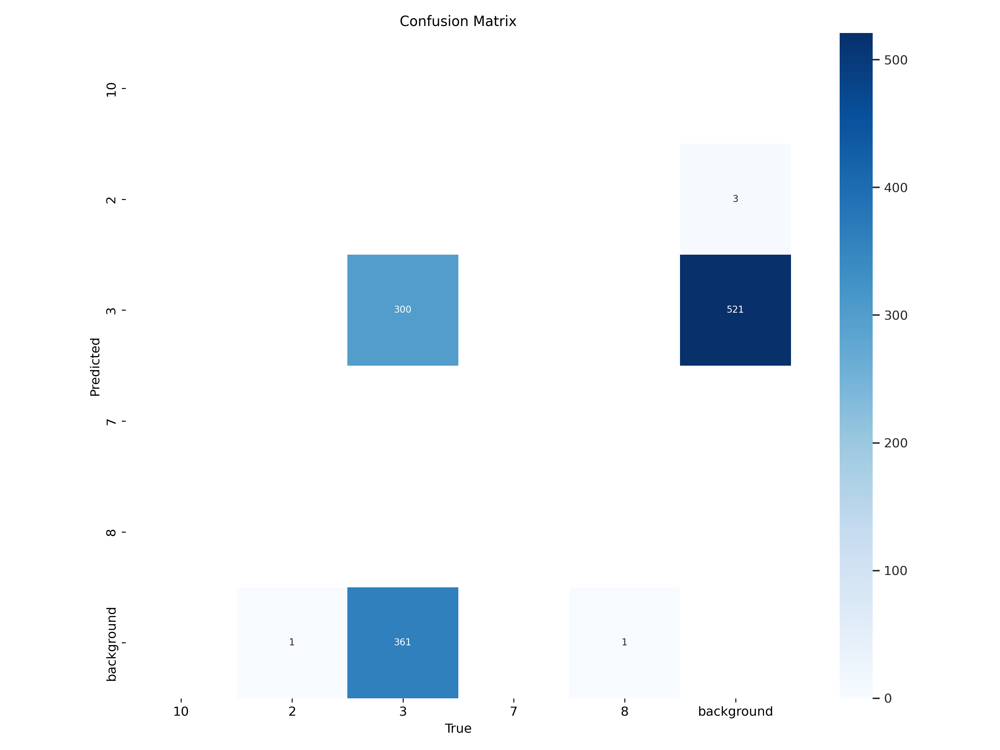

In [8]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/confusion_matrix.png', width=900)

Согласно результатам confusion matrix, модель ошибочно распознает объект (нечищенную дорогу/тротуар) там, где его на самом деле нет и теряет объект там, где он есть, ошибочно принимая его за окружающую среду (background).

/content


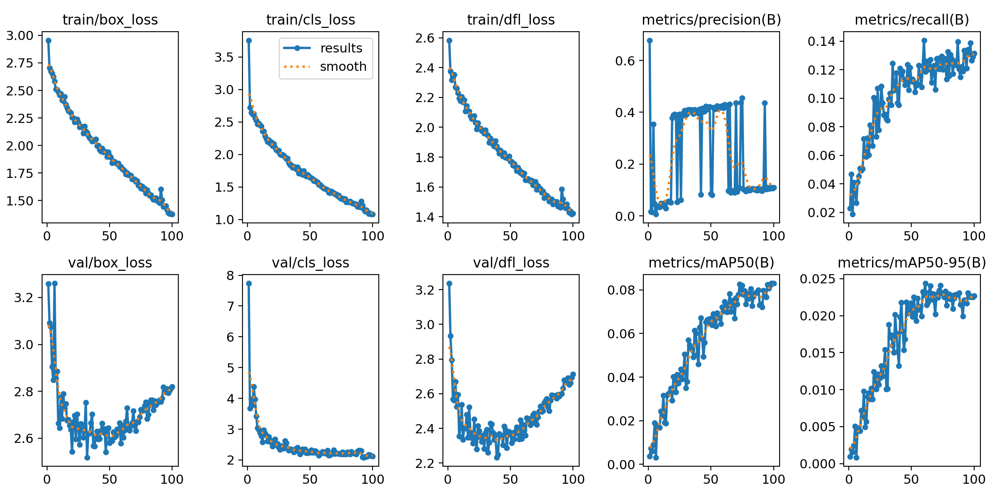

In [9]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/results.png', width=900)

/content


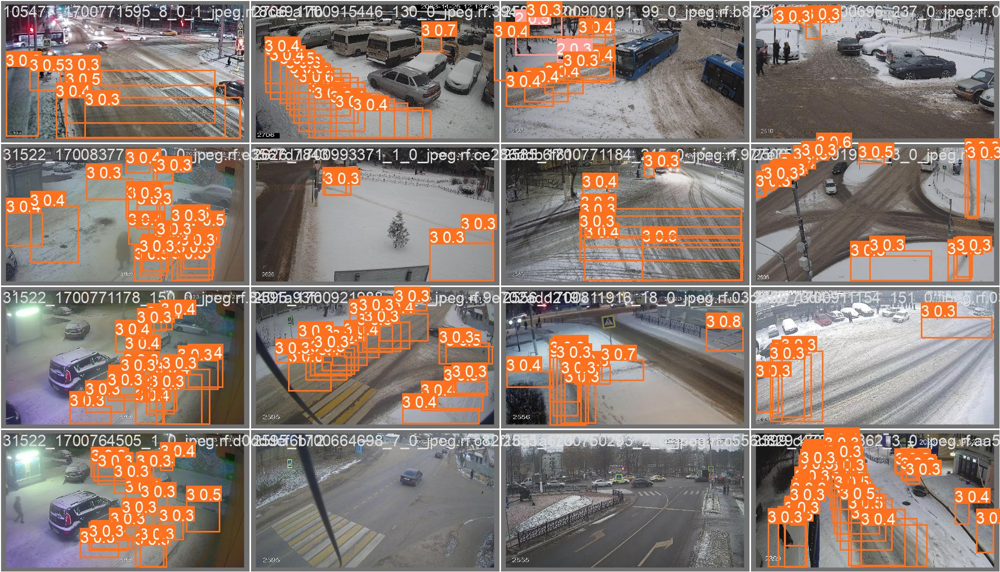

In [10]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/val_batch0_pred.jpg', width=1000)

На представленных изображениях хорошо видно, что объект (нечищенная дорога/ тротуар) не выделяется целиком, часть объекта остается без детекции.

## Валидация модели

In [11]:
%cd {HOME}

!yolo task=detect mode=val model={HOME}/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

/content
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11127519 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/datasets/Uncleaned-snow-4/valid/labels.cache... 117 images, 33 backgrounds, 0 corrupt: 100% 117/117 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 8/8 [00:09<00:00,  1.13s/it]
                   all        117        663      0.109      0.124     0.0829     0.0241
                     2        117          1          0          0          0          0
                     3        117        661      0.326      0.372      0.249     0.0724
                     8        117          1          0          0          0          0
Speed: 2.8ms preprocess, 12.6ms inference, 0.0ms loss, 14.6ms postprocess per image
Results saved to runs/detect/val
💡 Learn more at https://docs.ultralytics.com/modes/val


## Тестирование модели

In [12]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.25 source={dataset.location}/test/images save=True

/content
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11127519 parameters, 0 gradients, 28.4 GFLOPs

image 1/52 /content/datasets/Uncleaned-snow-4/test/images/105477_1700584898_127_0_1_jpeg.rf.1b984e4e168fb2387cc85a556eb3d50e.jpg: 384x640 (no detections), 85.1ms
WARNING ⚠️ NMS time limit 0.550s exceeded
image 2/52 /content/datasets/Uncleaned-snow-4/test/images/105477_1700812318_137_0_jpeg.rf.09825ae090f11d7b4ac4c803412a10d6.jpg: 384x640 4 3s, 10.7ms
image 3/52 /content/datasets/Uncleaned-snow-4/test/images/131479_1700490643_19_0_jpeg.rf.be6c28b750b9642d036c18694d898e53.jpg: 384x640 4 3s, 10.7ms
image 4/52 /content/datasets/Uncleaned-snow-4/test/images/131479_1700578113_1_0_jpeg.rf.63db54d862c93c1c31e9c4e0de885cf5.jpg: 384x640 (no detections), 10.7ms
image 5/52 /content/datasets/Uncleaned-snow-4/test/images/131676_1700681258_24_0_jpeg.rf.ef3915ee496c2b15e754bf01a0ef8eac.jpg: 384x640 (no detections), 10.7ms
ima

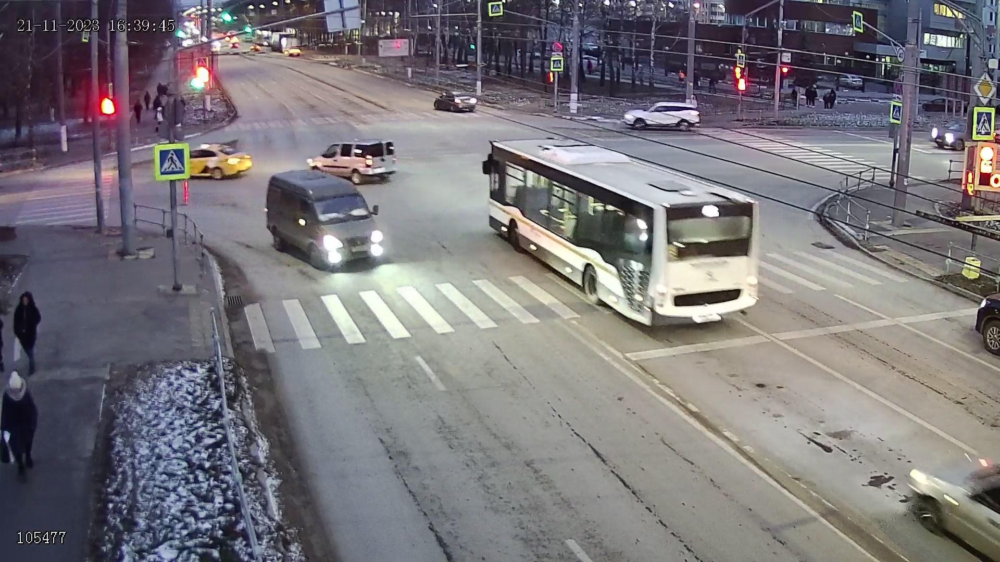

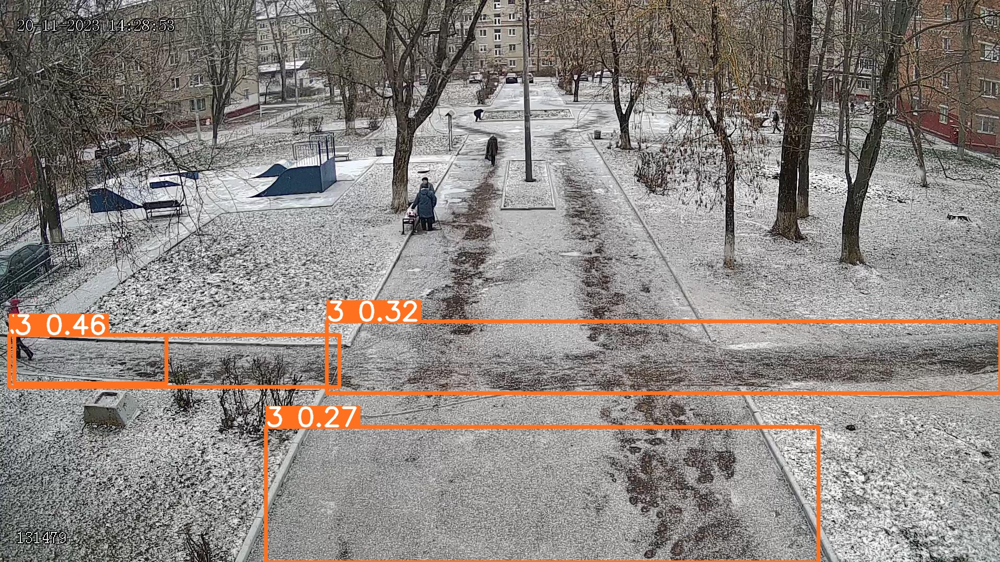

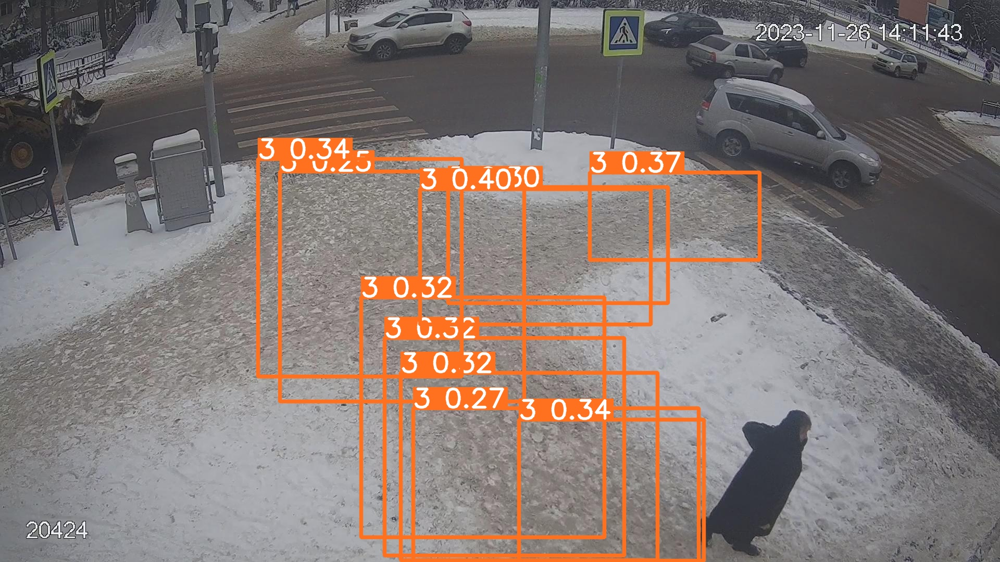

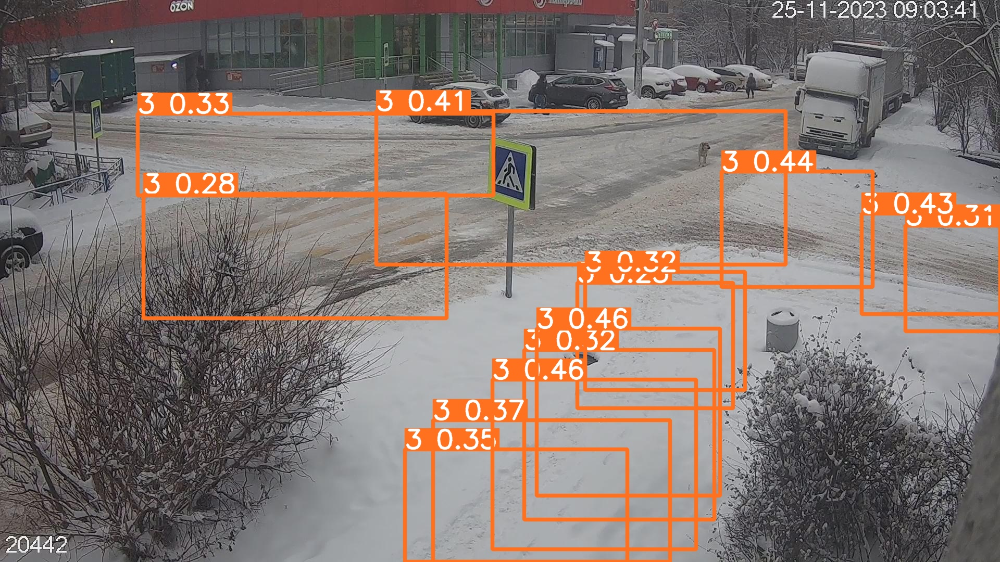

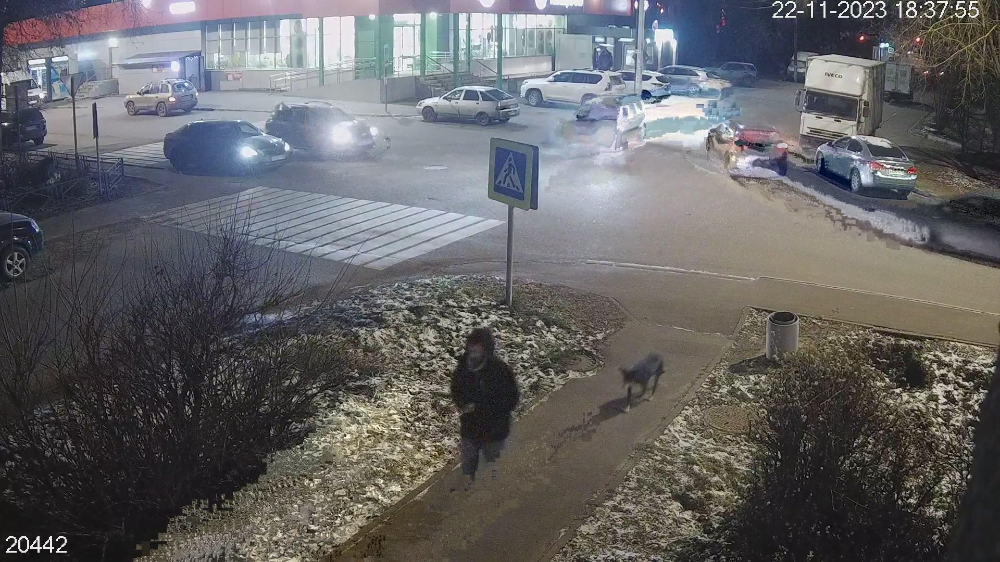

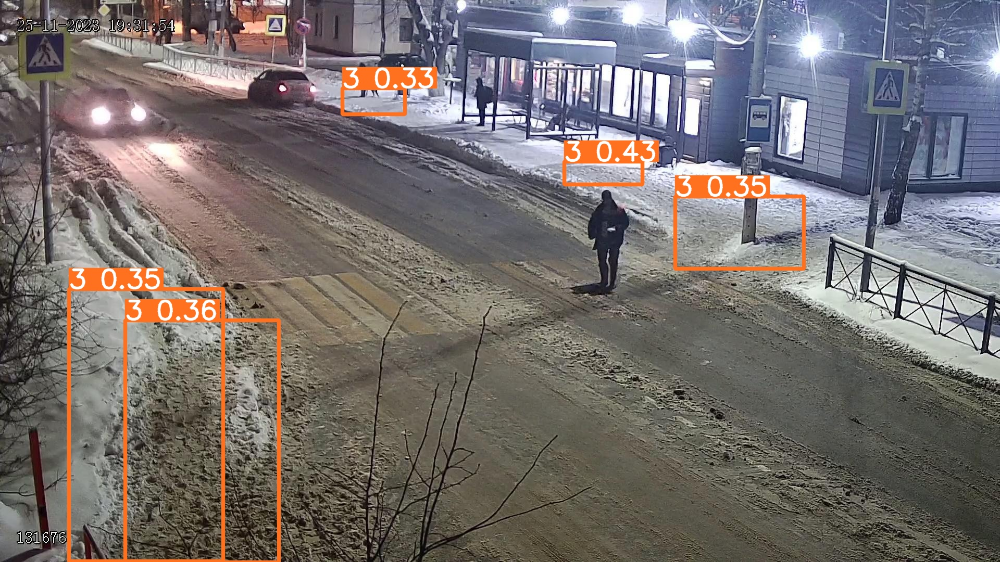

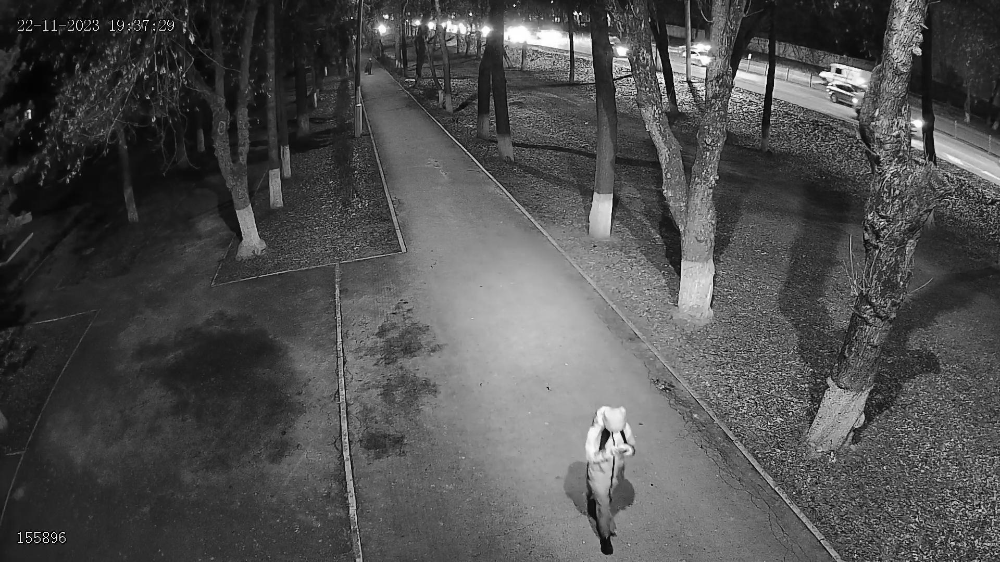

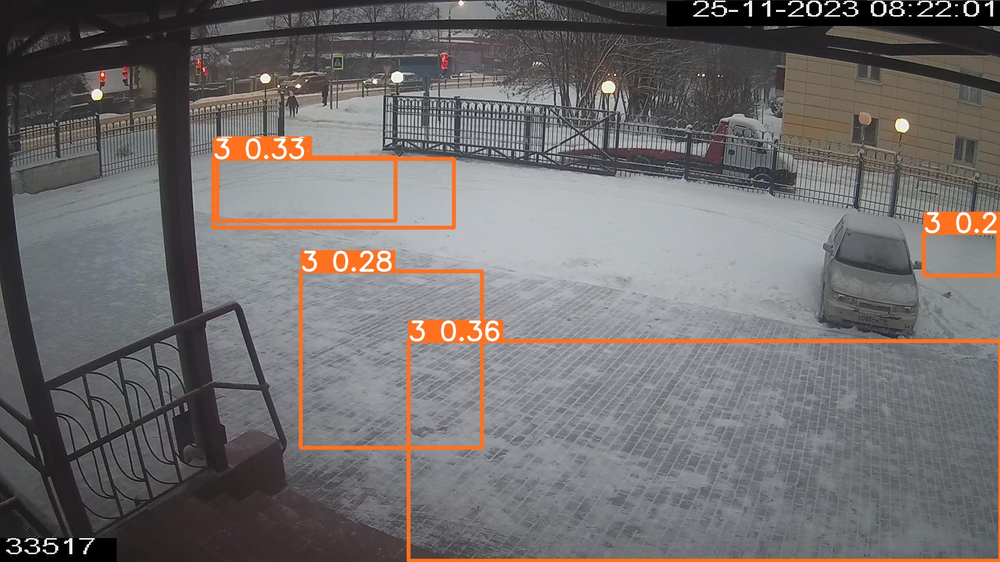

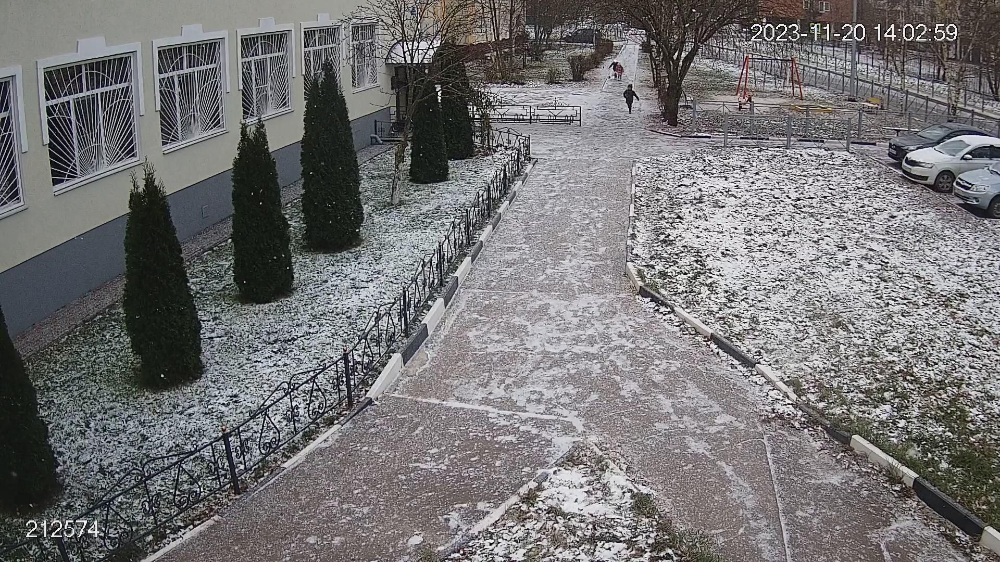

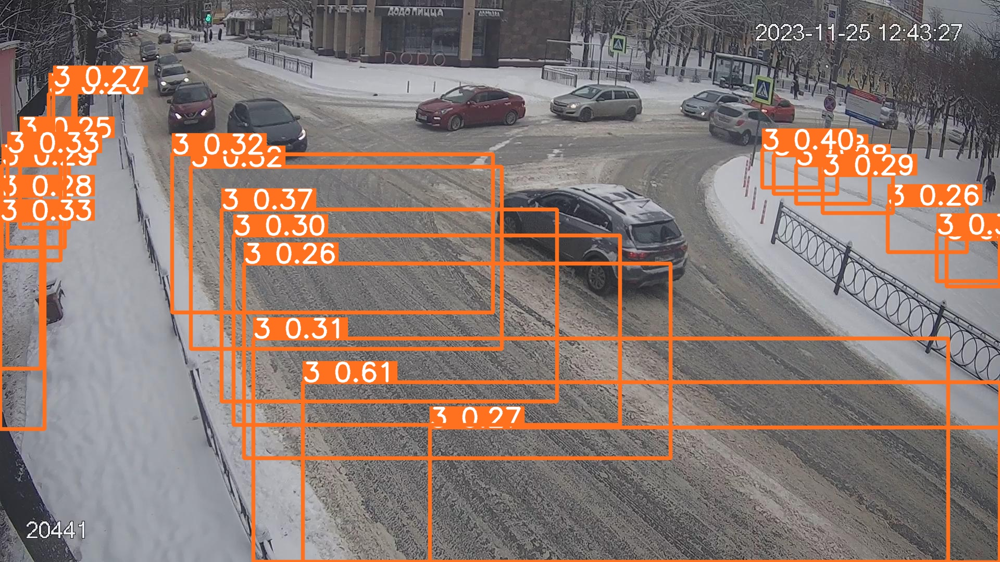

In [13]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/predict/*.jpg')[:10]:
      display(Image(filename=image_path, width=900))
      print("\n")

**Вывод**: Модель показала ухудшение метрик вдвое (mAP50 с 0.517 до 0.248) в распознавании нечищенного снега на дорогах и тротуаре.
Разбиение bbox c одного большого, охватывающего весь объект, но захватывающего и окружающую объект среду, на несколько bbox поменьше, которые захватывают больше полезного пространства и меньше окружения, не только не привело к повышению точности метрики mAP50, но и существенно ухудшило ее.

В результате экперимента необходимо вернуться к модели показавшей наилучшую точность и разметке датасета большими bbox, захватывающими объект целиком.
Включение экспериментального датасета в общий для обучения на полном наборе данных крайне не рекомендуется.